### Imports

In [0]:
dataset_id = '5y'

# Flight Data

flight_datasets = {
    '3m': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_3m/',
    '6m': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_6m/',
    '1y': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_1y/',
    '5y': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data/'
}

# Weather Data

weather_datasets = {
    '3m': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_3m/',
    '6m': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_6m/',
    '1y': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_1y/',
    '5y': 'dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data/'
}

ref_time = "2000-01-05 00:00:00"

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.functions import (
    col, 
    udf, 
    desc, 
    regexp_extract, 
    min as spark_min, 
    max as spark_max, 
    when, 
    expr
)
from pyspark.sql.types import (
    StructType, 
    StructField, 
    StringType, 
    IntegerType, 
    FloatType, 
    DoubleType,
    TimestampType
)

import pytz
from pyspark.sql.functions import udf


%pip install timezonefinder

import time
from datetime import datetime, timedelta
from timezonefinder import TimezoneFinder

import pytz

import math
import pandas as pd
import numpy as np
from numpy.linalg import eigh
from scipy.linalg import cho_factor, cho_solve
from scipy.special import kv, gamma


data_BASE_DIR = "dbfs:/mnt/mids-w261/"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/28.2 MB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.2/28.2 MB 7.6 MB/s eta 0:00:04
   ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/28.2 MB 24.2 MB/s eta 0:00:02
   ━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/28.2 MB 80.7 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━ 15.3/28.2 MB 204.4 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━ 22.6/28.2 MB 210.4 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 28.2/28.2 MB 214.6 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 28.2/28.2 MB 214.6 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.2/28.2 MB 96.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/1.0 MB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 88.9 MB/s eta 0:00:00
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


### Data Ingestion

In [0]:
def ingest_airports_dataset(df_flight_times):

    print("Ingesting airport data...")

    df_airports = (
        spark.read.csv(
            "dbfs:/mnt/mids-w261/airport-codes_csv.csv",
            header=True,
            inferSchema=True
        )
    )

    df_airports = (
        df_airports.withColumn(
            "long",
            F.split(F.col("coordinates"), ",")[0].cast("float")
        )
        .withColumn(
            "lat",
            F.split(F.col("coordinates"), ",")[1].cast("float")
        )
        .select("iata_code", "long", "lat")
        .dropna()
    )

    

    df_airports = df_airports.withColumn(
        "gmt_offset_hours",
        get_gmt_offset_spark(
            F.lit(ref_time),  # passed as string
            F.col("lat"),
            F.col("long")
        )
    )


    valid_airport_codes = (
        set(row["ORIGIN"] for row in df_flight_times.select("ORIGIN").distinct().collect())
        #.union(
        #    set(row["DEST"] for row in df_flight_times.select("DEST").distinct().collect())
        #)
    )
    print(f"Found {len(valid_airport_codes)} valid airport codes.")
    df_airports_us = df_airports.filter(df_airports.iata_code.isin(valid_airport_codes))

    print("Airport data ingested.")

    return df_airports_us

In [0]:
def ingest_flight_data(
    parquet_path="dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_3m/"
    ):
    print("Ingesting flight data...")

    df_flights = (
        spark.read.parquet(parquet_path)
        .dropDuplicates()
    )

    df_flights = df_flights.withColumn(
        "flight_uid",
        F.concat(
            F.col("ORIGIN"),
            F.lit("-"),
            F.col("FL_DATE"),
            F.lit("-"),
            F.when(F.col("OP_CARRIER_AIRLINE_ID").isNull(), F.floor(F.rand() * 100000 + 1).cast("int")).otherwise(F.col("OP_CARRIER_AIRLINE_ID")),
            F.lit("-"),
            F.when(F.col("OP_CARRIER_FL_NUM").isNull(), F.floor(F.rand() * 100000 + 1).cast("int")).otherwise(F.col("OP_CARRIER_FL_NUM")),
            F.lit("-"),
            F.when(F.col("TAIL_NUM").isNull(), F.floor(F.rand() * 100000 + 1).cast("int")).otherwise(F.col("TAIL_NUM")),
            F.lit("-"),
            F.col("CRS_DEP_TIME")
        ),
    )
    #flight date, flight carrier, originating airport, flight number

    df_flight_times = (
        df_flights.select(
            "flight_uid",
            "YEAR",
            "MONTH",
            "DAY_OF_MONTH",
            "ORIGIN",
            "DEST",
            "CRS_DEP_TIME",
            "DEP_TIME",
            "DEP_DELAY",
            "CRS_ARR_TIME",
            "ARR_TIME",
            "ARR_DELAY"
        )
        .withColumn("dep_hour*", F.floor(F.col("CRS_DEP_TIME") / 100))
        .withColumn(
            "dep_hour",
            F.when(
                F.col("dep_hour*") < 10,
                F.concat(F.lit("0"), F.col("dep_hour*").cast("string")),
            ).otherwise(F.col("dep_hour*").cast("string")),
        )
        .withColumn("year", F.col("YEAR"))
        .withColumn(
            "month",
            F.when(
                F.col("MONTH") < 10,
                F.concat(F.lit("0"), F.col("MONTH").cast("string")),
            ).otherwise(F.col("MONTH").cast("string")),
        )
        .withColumn(
            "day",
            F.when(
                F.col("DAY_OF_MONTH") < 10,
                F.concat(F.lit("0"), F.col("DAY_OF_MONTH").cast("string")),
            ).otherwise(F.col("DAY_OF_MONTH").cast("string")),
        )
        .withColumn(
            "dep_timestamp",
            F.concat(
                F.col("year"),
                F.lit("-"),
                F.col("month"),
                F.lit("-"),
                F.col("day"),
                F.lit("T"),
                (F.floor(F.col("CRS_DEP_TIME") /100)).cast("string"),
                F.lit(":"),
                (F.col("CRS_DEP_TIME")%100).cast("string"),
                F.lit(":00"),
            ),
        )
        .dropna()
    )

    df_flight_times = df_flight_times.withColumn("dep_timestamp", df_flight_times["dep_timestamp"].cast("timestamp"))

    print("Flight data ingested.")

    return df_flight_times, df_flights

#df_flight_times, df_flights = ingest_flight_data(flight_datasets[dataset_id])

# Verify that flight_uid is unique ID

#assert df_flight_times.count() == df_flight_times.select("flight_uid").distinct().count()

#print(f"{dataset_id} dataset ingested.")

#display(df_flight_times)

In [0]:
def ingest_weather_data(
    parquet_path="dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_3m/"
):
    print("Ingesting weather data...")
    df_weather = spark.read.parquet(parquet_path)

    exclude_cols = ["NAME", "REPORT_TYPE", "HourlySkyConditions", "STATION", 'DATE']
    cols_to_clean = [c for c in df_weather.columns if c not in exclude_cols]

    for c in cols_to_clean:
        df_weather = df_weather.withColumn(
            c,
            F.when(F.col(c).contains("*"), None)
            .otherwise(F.regexp_replace(F.col(c), r"[^0-9.\-]", ""))
            .cast("double"),
        )

    df_weather = df_weather.withColumn(
            "oktas",
            regexp_extract(col("HourlySkyConditions"), r".*([A-Z]{3}:)\s*([0-9]*)", 2).cast("int")
        ).withColumn(
            "elev_hundreds_ft",
            regexp_extract(col("HourlySkyConditions"), r".*([A-Z]{3}:)\s*([0-9]*)\s*([0-9]*)", 3).cast("int")
        )

    df_weather = df_weather.withColumn(
    "from_east",
    -1*col('HourlyWindSpeed')*F.sin(col('HourlyWindDirection')*F.pi()/180),
).withColumn("from_north",
    -1*col('HourlyWindSpeed')*F.cos(col('HourlyWindDirection')*F.pi()/180)
)

    df_weather = df_weather.withColumn("DATE", df_weather["DATE"].cast("timestamp"))

    weather_cols = ['HourlyDryBulbTemperature', 'HourlyWindSpeed', 'HourlyDewPointTemperature', 'HourlyRelativeHumidity', 'HourlyAltimeterSetting', 'HourlyVisibility', 'HourlyStationPressure', 'HourlyWetBulbTemperature', 'HourlySkyConditions', 'HourlyPrecipitation', 'oktas', 'elev_hundreds_ft', 'from_east', 'from_north']
    df_weather_col = df_weather.select(['DATE', 'STATION'] + weather_cols)

    print("Weather data ingested.")

    return df_weather


#df_weather = ingest_weather_data(weather_datasets[dataset_id])



#display(df_weather)



In [0]:



# Lazy singleton per executor
def _get_tf():
    if not hasattr(_get_tf, "instance"):
        _get_tf.instance = TimezoneFinder()
    return _get_tf.instance


def get_gmt_offset_udf(local_time_str, lat, long):
    
    tf = _get_tf()

    # Get timezone name
    tz_name = tf.timezone_at(lat=lat, lng=long)
    if tz_name is None:
        return None

    tz = pytz.timezone(tz_name)

    # Convert string to naive datetime
    local_time = datetime.strptime(local_time_str, "%Y-%m-%d %H:%M:%S")

    # Localize based on real timezone
    local_dt = tz.localize(local_time)

    # Get offset relative to UTC
    offset_hours = local_dt.utcoffset().total_seconds() / 3600.0
    return float(offset_hours)



# Spark UDF returning float (hours)
get_gmt_offset_spark = udf(get_gmt_offset_udf, FloatType())


In [0]:
def ingest_stations_data(df_weather):
    print("Ingesting stations data...")
    df_stations_w = (
        df_weather.groupBy("STATION")
        .agg(
            F.first(F.col("LONGITUDE")).alias("long"),
            F.first(F.col("LATITUDE")).alias("lat"),
        )
        .dropna()
    )

    df_stations_w = df_stations_w.withColumn(
        "gmt_offset_hours",
        get_gmt_offset_spark(
            F.lit(ref_time),  # passed as string
            F.col("lat"),
            F.col("long")
        )
    )

    print("Stations data ingested.")
    return df_stations_w

#df_stations_w = ingest_stations_data(df_weather)


In [0]:


#display(df_airports_us)


###Kriging Helpers

In [0]:
#EMPIRICAL_RADIUS = 50 # km
EARTH_RADIUS_M = 6_371_008.8

def haversine_np(lat1, lon1, lat2, lon2, *, radius=EARTH_RADIUS_M):
    """
    Vectorized great-circle distance.

    Inputs can be scalars or NumPy arrays (broadcastable to a common shape).
    Angles are in degrees. Returns distances in meters as float64.
    """
    lat1 = np.asarray(lat1, dtype=np.float64)
    lon1 = np.asarray(lon1, dtype=np.float64)
    lat2 = np.asarray(lat2, dtype=np.float64)
    lon2 = np.asarray(lon2, dtype=np.float64)

    # Convert degrees → radians in one pass
    φ1 = np.radians(lat1); λ1 = np.radians(lon1)
    φ2 = np.radians(lat2); λ2 = np.radians(lon2)

    dφ = φ2 - φ1
    dλ = λ2 - λ1

    s = np.sin(dφ * 0.5)
    t = np.sin(dλ * 0.5)
    a = s*s + np.cos(φ1) * np.cos(φ2) * t*t

    # Numerical guard ensures domain safety for asin
    return (2.0 * radius) * np.arcsin(np.minimum(1.0, np.sqrt(a)))/1000


def brute_force_nearest_all_hvn(points, q, top_n=100):
    codes = points[:, -1]
    points = points[:, :-1].astype(float)
    d2 = haversine_np(points[:,1], points[:,0], q[1], q[0])
    dist_indices = np.argsort(d2)[:top_n]
    dist_sorted = np.sort(d2)[:top_n]

    return np.stack([dist_sorted, codes[dist_indices]], axis=1)

def nearest_all_hvn(airport_points, station_points):
    print("--- Nearest All Called---")
    dist_lists_hvn = []
    codes = airport_points[:, -1]
    airport_points = airport_points[:, :-1].astype(float)
    n = len(airport_points)
    
    for i, q in enumerate(airport_points):
        dist_lists_hvn.append((codes[i], brute_force_nearest_all_hvn(station_points, q)))

    return dist_lists_hvn



In [0]:


def get_neighbor_df(df_stations_w, df_airports_us):
    print("Creating Neighbor df...")
    
    station_points = np.array(df_stations_w.select("long", "lat", 'STATION').collect())
    airport_points = np.array(df_airports_us.select("long", "lat", 'iata_code').collect())
    dist_lists_hvn = nearest_all_hvn(airport_points, station_points)

    dist_data = []

    for airport_code, dist_list in dist_lists_hvn:
        for dist, station_code in dist_list:
            #if float(dist) < EMPIRICAL_RADIUS:
            dist_data.append([airport_code, station_code, float(dist)])

    schema = StructType([
        StructField("airport_code", StringType(), True),
        StructField("station_code", StringType(), True),
        StructField("distance", FloatType(), True)
    ])

    neighbor_df = pd.DataFrame(dist_data, columns=['airport_code', 'station_code', 'distance'])
    neighbor_df = spark.createDataFrame(neighbor_df, schema=schema)

    print("Neighbor df created.")

    return neighbor_df
    

#### Begin Plots

#### End Plots

In [0]:
# set a_s to 50km
# make sure to scale the weather measurements on training data!!!



# parameters (example)
nu_s = 1.5 # moderate balance between exponential and gaussian
a_s = 10.0 #50.0  # km
sigma2_s = 1.0 # assumes standardized weather readings
epsilon = 1e-10 # numerical stability


def matern_covariance(h, nu, a, sigma2):
    h = np.maximum(h, epsilon)
    coef = sigma2 * (2**(1-nu)) / gamma(nu)
    val = coef * (h/a)**nu * kv(nu, h/a)
    # ensure finite at h=0 (Kν(0)→∞ but limit → σ²)
    val[np.isnan(val)] = sigma2
    return val

# UDF for PySpark


# Broadcast values for UDF
nu_s_b = sc.broadcast(nu_s)
a_s_b = sc.broadcast(a_s)
sigma2_s_b = sc.broadcast(sigma2_s)
epsilon_b = sc.broadcast(epsilon)

#@udf(returnType=DoubleType())
def matern_udf(distance_km: float) -> float:
    h = max(distance_km, epsilon_b.value)
    val = (2**(1-nu_s))/gamma(nu_s) * (h/a_s)**nu_s * kv(nu_s, h/a_s)
    return float(sigma2_s * val) if not math.isnan(val) else float(sigma2_s)

# neighbors: (airport_id, station_id, distance_km)




k_0 = matern_udf(0)  # ensure this returns sigma^2 exactly

def matern_covariance_neighbors(cov_df):
    station_points = cov_df[['lat_station', 'long_station']].values
    station_codes = cov_df['station_code'].values
    n = len(station_points)
    K_xx = np.empty((n, n), dtype=float)

    for i in range(n):
        # diagonal
        K_xx[i, i] = k_0
        # upper triangle
        for j in range(i+1, n):
            d = haversine_np(station_points[i][0], station_points[i][1],
                             station_points[j][0], station_points[j][1])
            cij = matern_udf(d)
            K_xx[i, j] = cij
            K_xx[j, i] = cij

    # cross-covariances airport–station (already computed and stored as C_space)
    K_x = cov_df['C_space'].to_numpy(dtype=float)  # shape (n,)
    return K_xx, K_x, station_codes

def solve_covariance_weights(cov_df, nugget_rel=1e-10):
    K_xx, K_x, station_codes = matern_covariance_neighbors(cov_df)
    n = K_x.shape[0]
    ones = np.ones(n, dtype=float)

    # --- Add a nugget BEFORE solving (relative to k0 for scale) ---
    nugget = nugget_rel * k_0
    K_xx_jit = K_xx.copy()
    np.fill_diagonal(K_xx_jit, np.diag(K_xx_jit) + nugget)

    # Optional PD check (for debugging)
    # lam_min = np.min(eigh(K_xx_jit, eigvals_only=True))
    # if lam_min <= 0: print("Warning: K_xx still near-indefinite; nugget too small")

    # --- Two SPD solves instead of augmented indefinite solve ---
    c_fac = cho_factor(K_xx_jit, check_finite=False)
    alpha = cho_solve(c_fac, ones, check_finite=False)   # K_xx * alpha = 1
    beta  = cho_solve(c_fac, K_x,  check_finite=False)   # K_xx * beta  = K_x

    denom = ones @ alpha
    lam = (1.0 - ones @ beta) / denom
    w = beta + lam * alpha

    # Ordinary kriging variance (stable form)
    var = k_0 - w @ K_x - lam

    # Clip tiny negatives caused by fp error
    if var < 0 and var > -1e-10 * k_0:
        var = 0.0

    return w, lam, float(var), station_codes




In [0]:
def get_spatial_cov_matrix(neighbor_df, df_stations_w, df_airports_us, spatial_radius):
    print("Computing spatial covariance matrix...")
    spatial_cov = neighbor_df.toPandas()
    spatial_cov_rad = spatial_cov[spatial_cov['distance'] < spatial_radius]
    spatial_cov_rad['C_space'] = spatial_cov['distance'].apply(matern_udf)

    # now, join with df_stations_w

    spatial_cov_rad = spatial_cov_rad.merge(df_stations_w.toPandas(), left_on='station_code', right_on='STATION', suffixes=('', '_station')).drop(['STATION'], axis=1).rename(columns={'lat':'lat_station', 'long':'long_station'})
    spatial_cov_rad = spatial_cov_rad.merge(df_airports_us.toPandas(), left_on='airport_code', right_on='iata_code', suffixes=('','_airport')).drop(['iata_code'], axis=1).rename(columns={'lat':'lat_airport', 'long':'long_airport'})

    coord_cols = ['lat_station', 'long_station', 'lat_airport', 'long_airport']

    spatial_cov_rad = spatial_cov_rad.astype({
        col: 'float64' for col in coord_cols
    })

    print("Computing spatial covariance matrix...done")
    return spatial_cov_rad

In [0]:
def solve_partial_weights(spatial_cov_rad):

    full_sol = spatial_cov_rad.groupby('airport_code').apply(solve_covariance_weights)
    full_sol_data = []
    for airport_code in full_sol.index:
        sol = full_sol[airport_code]
        for weight, station_code in zip(sol[0], sol[-1]):
            full_sol_data.append([airport_code, station_code, weight, sol[1], sol[2]]) #lamda and var respectively

    full_sol_pd_df = pd.DataFrame(full_sol_data, columns=['airport_code', 'station_code', 'weight', 'lambda', 'variance'])

    return full_sol_pd_df

def solve_full_weights(spatial_cov_rad, time_radius, dropoff=5): # 5 hour dropoff
    print('Solving station weights')
    full_sol_pd_df = solve_partial_weights(spatial_cov_rad)

    # Trim first pass
    min_st_weight = 0.001
    min_weight = min_st_weight/np.exp(-time_radius/dropoff)
    valid_weights = full_sol_pd_df[abs(full_sol_pd_df['weight']) > min_weight]
    valid_weights = valid_weights[['airport_code', 'station_code']]

    spatial_cov_rad_filtered = spatial_cov_rad.merge(valid_weights, on=['airport_code', 'station_code'], how='inner', suffixes=('', '_filtered'))

    full_sol_pd_df_filtered = solve_partial_weights(spatial_cov_rad_filtered)

    weight_df = spatial_cov_rad_filtered.merge(full_sol_pd_df_filtered, on=['airport_code', 'station_code'], how='left', suffixes=('', '_sol'))

    df_neighbor_weights = spark.createDataFrame(weight_df)#.cache()
    print('Station weights solved.')
    return df_neighbor_weights

### Flight Join

In [0]:


def add_dep_timestamp_gmt(df, new_col_name, timestamp_col_name):
    df = df.withColumn(
        new_col_name,
        (col(timestamp_col_name).cast("long") - (expr("gmt_offset_hours") * 3600)).cast("timestamp")
    )

    return df


In [0]:
def prep_data_for_join(df_flight_times, df_weather, df_stations_w, df_neighbor_weights):

    print("Prepping Data for Join")
    station_codes = [row['station_code'] for row in df_neighbor_weights.select('station_code').distinct().collect()]
    df_weather_col_filtered = df_weather.filter(df_weather['STATION'].isin(station_codes)).join(df_stations_w, on="STATION", how="left")

    ## Add GMT Offset
    df_flight_times = add_dep_timestamp_gmt(df_flight_times, new_col_name="dep_timestamp_gmt", timestamp_col_name="dep_timestamp")

    df_weather_col_filtered = add_dep_timestamp_gmt(df_weather_col_filtered, new_col_name="DATE_gmt", timestamp_col_name="DATE")

    print("Data Prep Complete")

    return df_flight_times, df_weather_col_filtered

In [0]:
def clip_imputations(result_df, df_weather_col_filtered):
    weather_cols_set = set(df_weather_col_filtered.columns)
    clip_cols = [c for c in result_df.columns if c in weather_cols_set]

    for c in clip_cols:
        min_val = df_weather_col_filtered.agg(spark_min(col(c))).first()[0]
        max_val = df_weather_col_filtered.agg(spark_max(col(c))).first()[0]
        result_df = result_df.withColumn(
            c,
            when(col(c) < min_val, min_val)
            .when(col(c) > max_val, max_val)
            .otherwise(col(c))
        )

    result_df = (
        result_df.withColumn(
            "HourlyCloudElevation",
            when(col("HourlyCloudElevation") < 0, 0)
            .when(col("HourlyCloudElevation") > 1000, 1000)
            .otherwise(col("HourlyCloudElevation"))
        )
        .withColumn(
            "HourlyCloudCoverage",
            when(col("HourlyCloudCoverage") < 0, 0)
            .when(col("HourlyCloudCoverage") > 8, 8)
            .otherwise(col("HourlyCloudCoverage"))
        )
    )

    return result_df

In [0]:
def custom_sql_join(df_flight_times, df_neighbor_weights, df_weather_col_filtered, df_flights, time_radius):
  print("Performing Custom Join")
  df_flight_times.createOrReplaceTempView("t1") 
  df_neighbor_weights.createOrReplaceTempView("t2") 
  df_weather_col_filtered.createOrReplaceTempView("t3") 

  # first, get all readings from all stations for all flights within time horizon
  # then, for each flight_id and station, get one reading per station
  print("----Running SQL Query...")
  result_df = spark.sql(f"""
  with flight_readings as (                   
  SELECT t1.flight_uid,
        t3.*,
        EXP((CAST(t1.dep_timestamp_gmt AS double) - CAST(t3.DATE_gmt AS double)) / (-3600.0 * 5)) AS t_weight, -- time weight
        t2.weight as s_weight -- space weight
  FROM t1
  JOIN t2 ON t1.ORIGIN = t2.airport_code
  JOIN t3 ON t2.station_code = t3.STATION
      AND t3.DATE_gmt <= t1.dep_timestamp_gmt  - INTERVAL 2 HOURS
      AND t3.DATE_gmt >= t1.dep_timestamp_gmt - INTERVAL {time_radius} HOURS
  ),
  flight_station_agg as (
      select
          flight_uid,
          STATION,
          FIRST(s_weight) as s_weight,
          SUM(t_weight * HourlyDryBulbTemperature) / NULLIF(SUM(CASE WHEN HourlyDryBulbTemperature IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_temp,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyDewPointTemperature) / NULLIF(SUM(CASE WHEN HourlyDewPointTemperature IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_dew_temp,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyRelativeHumidity) / NULLIF(SUM(CASE WHEN HourlyRelativeHumidity IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_rel_humid,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyAltimeterSetting) / NULLIF(SUM(CASE WHEN HourlyAltimeterSetting IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_alt_set,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyVisibility) / NULLIF(SUM(CASE WHEN HourlyVisibility IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_viz,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyStationPressure) / NULLIF(SUM(CASE WHEN HourlyStationPressure IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_pressure,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyWetBulbTemperature) / NULLIF(SUM(CASE WHEN HourlyWetBulbTemperature IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_wet_temp,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * HourlyPrecipitation) / NULLIF(SUM(CASE WHEN HourlyPrecipitation IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_precip,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * oktas) / NULLIF(SUM(CASE WHEN oktas IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_oktas,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * elev_hundreds_ft) / NULLIF(SUM(CASE WHEN elev_hundreds_ft IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_elev_hundreds_ft,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * from_north) / NULLIF(SUM(CASE WHEN from_north IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_from_north,
          -------------------------------------------------------------------------------------------------------
          SUM(t_weight * from_east) / NULLIF(SUM(CASE WHEN from_east IS NULL THEN 0 ELSE t_weight END), 0) as station_time_agg_from_east
        
          from flight_readings
          group by flight_uid, STATION
  ),
  agg AS (
    SELECT
      flight_uid,
      SUM(CASE WHEN station_time_agg_temp IS NULL THEN 0 ELSE s_weight END) as temp_div,
      SUM(s_weight * station_time_agg_temp) as temp_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_dew_temp IS NULL THEN 0 ELSE s_weight END) as dew_temp_div,
      SUM(s_weight * station_time_agg_dew_temp) as dew_temp_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_rel_humid IS NULL THEN 0 ELSE s_weight END) as humid_div,
      SUM(s_weight * station_time_agg_rel_humid) as humid_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_alt_set IS NULL THEN 0 ELSE s_weight END) as alt_set_div,
      SUM(s_weight * station_time_agg_alt_set) as alt_set_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_viz IS NULL THEN 0 ELSE s_weight END) as viz_div,
      SUM(s_weight * station_time_agg_viz) as viz_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_pressure IS NULL THEN 0 ELSE s_weight END) as press_div,
      SUM(s_weight * station_time_agg_pressure) as press_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_wet_temp IS NULL THEN 0 ELSE s_weight END) as temp_wet_div,
      SUM(s_weight * station_time_agg_wet_temp) as temp_wet_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_precip IS NULL THEN 0 ELSE s_weight END) as precip_div,
      SUM(s_weight * station_time_agg_precip) as precip_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_oktas IS NULL THEN 0 ELSE s_weight END) as oktas_div,
      SUM(s_weight * station_time_agg_oktas) as oktas_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_elev_hundreds_ft IS NULL THEN 0 ELSE s_weight END) as elev_div,
      SUM(s_weight * station_time_agg_elev_hundreds_ft) as elev_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_from_north IS NULL THEN 0 ELSE s_weight END) as north_div,
      SUM(s_weight * station_time_agg_from_north) as north_w_sum,
      -------------------------------------------------------------------------------------------------------
      SUM(CASE WHEN station_time_agg_from_east IS NULL THEN 0 ELSE s_weight END) as east_div,
      SUM(s_weight * station_time_agg_from_east) as east_w_sum
      

    FROM flight_station_agg
    GROUP BY flight_uid
  )

  select flight_uid, 
        temp_w_sum / temp_div as HourlyDryBulbTemperature, 
        dew_temp_w_sum / dew_temp_div as HourlyDewPointTemperature, 
        humid_w_sum / humid_div as HourlyRelativeHumidity, 
        alt_set_w_sum / alt_set_div as HourlyAltimeterSetting, 
        viz_w_sum / viz_div as HourlyVisibility, 
        press_w_sum / press_div as HourlyStationPressure, 
        temp_wet_w_sum / temp_wet_div as HourlyWetBulbTemperature, 
        precip_w_sum / precip_div as HourlyPrecipitation,
        oktas_w_sum / oktas_div as HourlyCloudCoverage, 
        elev_w_sum / elev_div as HourlyCloudElevation,
        SQRT(POWER(north_w_sum/north_div, 2) + POWER(east_w_sum/east_div, 2)) as HourlyWindSpeed
  from agg
  """)
  print("----Clipping imputations")
  join_df = clip_imputations(result_df, df_weather_col_filtered)

  print("----Joining with original flight data")
  final_df = df_flights.join(join_df, how='left', on='flight_uid').cache()

  print("Custom Join Complete")

  return final_df


In [0]:
# flights and weather will be on a per dataset basis

def save_join_df(final_df, dataset_id, version="recover", name=""):
    print("Saving to parquet")
    # Define your personal folder path within the shared mount
    my_folder = f"dbfs:/mnt/mids-w261/daniel_costa@berkeley.edu/Custom_Joins/V-{version}"
    # Optionally create the directory if it doesn’t exist
    dbutils.fs.mkdirs(my_folder)

    if name is not None:
        name = f"_{name}"

    # Define the full path for your large Parquet file
    parquet_path = f"{my_folder}/custom_join_{dataset_id}{name}.parquet"


    final_df = final_df.persist()
    final_df.checkpoint(eager=True)
    # Write the Spark DataFrame
    try:
        files = dbutils.fs.ls(my_folder)
        final_df.write.mode("overwrite").parquet(parquet_path)
        print(f"✅ DataFrame successfully written to: {parquet_path}")
    except Exception as e:
        raise e
        

    




In [0]:
display(dbutils.fs.ls('dbfs:/student-groups/Group_2_2'))

path,name,size,modificationTime
dbfs:/student-groups/Group_2_2/84m_after_c_t/,84m_after_c_t/,0,1765040406384
dbfs:/student-groups/Group_2_2/84m_after_c_t_f/,84m_after_c_t_f/,0,1765040406384
dbfs:/student-groups/Group_2_2/84m_after_c_t_f_w/,84m_after_c_t_f_w/,0,1765040406384
dbfs:/student-groups/Group_2_2/84m_after_cleaning/,84m_after_cleaning/,0,1765040406384
dbfs:/student-groups/Group_2_2/84m_before_cast/,84m_before_cast/,0,1765040406384
dbfs:/student-groups/Group_2_2/84m_ctwg/,84m_ctwg/,0,1765040406384
dbfs:/student-groups/Group_2_2/checkpoint_dir/,checkpoint_dir/,0,1765040406384
dbfs:/student-groups/Group_2_2/checkpoints/,checkpoints/,0,1765040406384
dbfs:/student-groups/Group_2_2/df_1yr_feature_derived/,df_1yr_feature_derived/,0,1765040406384
dbfs:/student-groups/Group_2_2/df_1yr_feature_selection/,df_1yr_feature_selection/,0,1765040406384


In [0]:
def run_custom_join(dataset_id='3m', spatial_radius=50, time_radius=12):
    print(f"Running {dataset_id}, spatial_radius={spatial_radius}, time_radius={time_radius}")
    # Ingest Data
    df_flight_times, df_flights = ingest_flight_data(flight_datasets[dataset_id])
    df_airports_us = ingest_airports_dataset(df_flight_times)
    print(f"There are {df_airports_us.count()} airports in the US")

    df_flight_times = df_flight_times.join(df_airports_us, df_flight_times.ORIGIN == df_airports_us.iata_code, how='left')

    df_weather = ingest_weather_data(weather_datasets[dataset_id])
    df_stations_w = ingest_stations_data(df_weather)


    print(f"{dataset_id} dataset ingested.")


    # Pre-Compute Weights
    neighbor_df = get_neighbor_df(df_stations_w, df_airports_us)

    spatial_cov_rad = get_spatial_cov_matrix(neighbor_df, df_stations_w, df_airports_us, spatial_radius)

    df_neighbor_weights = solve_full_weights(spatial_cov_rad, time_radius)

    # Filter Data for Join

    df_flight_times, df_weather_col_filtered = prep_data_for_join(df_flight_times, df_weather, df_stations_w, df_neighbor_weights)

    # Actually Do the Join

    join_df = custom_sql_join(df_flight_times, df_neighbor_weights, df_weather_col_filtered, df_flights, time_radius)
    
    name = f"sr={spatial_radius}km-tr={time_radius}hrs"

    save_join_df(join_df, dataset_id, version="tune-uid-correct", name=name) #later will be hyperparams

    return join_df

In [0]:
spark.sparkContext.setCheckpointDir("/tmp/spark-checkpoints")

In [0]:
import time

spatial_radii = [10, 25, 50]
time_radii = [4, 8, 12]

start_time = time.time()
for spatial_radius in spatial_radii:
    for time_radius in time_radii:
        for dataset_id in ['3m', '1y', '5y']:
            if spatial_radius != 50 or time_radius != 12:
                continue
            final_df = run_custom_join(dataset_id=dataset_id, spatial_radius=spatial_radius, time_radius=time_radius)
            size_bytes = final_df._jdf.queryExecution().optimizedPlan().stats().sizeInBytes()
            size_mb = size_bytes / (1024 * 1024)
            print(f"spatial_radius={spatial_radius}, time_radius={time_radius}: final_df size = {size_mb:.2f} MB")

end_time = time.time()
print(f"Total elapsed time: {end_time - start_time:.2f} seconds")

Running 3m, spatial_radius=50, time_radius=12
Ingesting flight data...
Flight data ingested.
Ingesting airport data...
Found 315 valid airport codes.
Airport data ingested.
There are 315 airports in the US
Ingesting weather data...
Weather data ingested.
Ingesting stations data...
Stations data ingested.
3m dataset ingested.
Creating Neighbor df...
--- Nearest All Called---
Neighbor df created.
Computing spatial covariance matrix...


/root/.ipykernel/4689/command-1792055957776906-1099656882:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spatial_cov_rad['C_space'] = spatial_cov['distance'].apply(matern_udf)


Computing spatial covariance matrix...done
Solving station weights
Station weights solved.
Prepping Data for Join
Data Prep Complete
Performing Custom Join
----Running SQL Query...
----Clipping imputations
----Joining with original flight data
Custom Join Complete
Saving to parquet
✅ DataFrame successfully written to: dbfs:/mnt/mids-w261/daniel_costa@berkeley.edu/Custom_Joins/V-tune-uid-correct/custom_join_3m_sr=50km-tr=12hrs.parquet
spatial_radius=50, time_radius=12: final_df size = 958.06 MB
Running 1y, spatial_radius=50, time_radius=12
Ingesting flight data...
Flight data ingested.
Ingesting airport data...
Found 360 valid airport codes.
Airport data ingested.
There are 360 airports in the US
Ingesting weather data...
Weather data ingested.
Ingesting stations data...
Stations data ingested.
1y dataset ingested.
Creating Neighbor df...
--- Nearest All Called---
Neighbor df created.
Computing spatial covariance matrix...


/root/.ipykernel/4689/command-1792055957776906-1099656882:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spatial_cov_rad['C_space'] = spatial_cov['distance'].apply(matern_udf)


Computing spatial covariance matrix...done
Solving station weights
Station weights solved.
Prepping Data for Join
Data Prep Complete
Performing Custom Join
----Running SQL Query...
----Clipping imputations
----Joining with original flight data
Custom Join Complete
Saving to parquet
✅ DataFrame successfully written to: dbfs:/mnt/mids-w261/daniel_costa@berkeley.edu/Custom_Joins/V-tune-uid-correct/custom_join_1y_sr=50km-tr=12hrs.parquet
spatial_radius=50, time_radius=12: final_df size = 5075.40 MB
Running 5y, spatial_radius=50, time_radius=12
Ingesting flight data...
Flight data ingested.
Ingesting airport data...
Found 386 valid airport codes.
Airport data ingested.
There are 386 airports in the US
Ingesting weather data...
Weather data ingested.
Ingesting stations data...
Stations data ingested.
5y dataset ingested.
Creating Neighbor df...
--- Nearest All Called---
Neighbor df created.
Computing spatial covariance matrix...


/root/.ipykernel/4689/command-1792055957776906-1099656882:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spatial_cov_rad['C_space'] = spatial_cov['distance'].apply(matern_udf)


Computing spatial covariance matrix...done
Solving station weights
Station weights solved.
Prepping Data for Join
Data Prep Complete
Performing Custom Join
----Running SQL Query...
----Clipping imputations
----Joining with original flight data
Custom Join Complete
Saving to parquet
✅ DataFrame successfully written to: dbfs:/mnt/mids-w261/daniel_costa@berkeley.edu/Custom_Joins/V-tune-uid-correct/custom_join_5y_sr=50km-tr=12hrs.parquet
spatial_radius=50, time_radius=12: final_df size = 29164.75 MB
Total elapsed time: 6765.14 seconds


In [0]:
dataset_infos = [('3m', '3_month'), ('1y', '1_year'), ('5y', '5_year')]

for id, name in dataset_infos:
    print(f"Moving {id} to {name}")
    filename = f"custom_join_{id}_sr=50km-tr=12hrs.parquet"
    old_file_path = f"dbfs:/mnt/mids-w261/daniel_costa@berkeley.edu/Custom_Joins/V-tune-uid-correct/{filename}"
    new_path = f"dbfs:/student-groups/Group_2_2/{name}_custom_joined"
    dbutils.fs.mv(old_file_path, new_path, recurse=True)

Moving 3m to 3_month
Moving 1y to 1_year
Moving 5y to 5_year


In [0]:
display(dbutils.fs.ls('dbfs:/student-groups/Group_2_2/5_year_custom_joined'))

path,name,size,modificationTime
dbfs:/student-groups/Group_2_2/5_year_custom_joined/_SUCCESS,_SUCCESS,0,1765047563000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/_committed_8282885959277550285,_committed_8282885959277550285,20424,1765047563000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/_started_8282885959277550285,_started_8282885959277550285,0,1765047564000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00000-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16367-1.c000.snappy.parquet,part-00000-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16367-1.c000.snappy.parquet,32819359,1765047564000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00001-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16369-1.c000.snappy.parquet,part-00001-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16369-1.c000.snappy.parquet,32759831,1765047565000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00002-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16371-1.c000.snappy.parquet,part-00002-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16371-1.c000.snappy.parquet,32643094,1765047565000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00003-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16372-1.c000.snappy.parquet,part-00003-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16372-1.c000.snappy.parquet,32907582,1765047566000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00004-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16381-1.c000.snappy.parquet,part-00004-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16381-1.c000.snappy.parquet,32796473,1765047567000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00005-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16373-1.c000.snappy.parquet,part-00005-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16373-1.c000.snappy.parquet,32670260,1765047568000
dbfs:/student-groups/Group_2_2/5_year_custom_joined/part-00006-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16383-1.c000.snappy.parquet,part-00006-tid-8282885959277550285-0438b4c2-86db-4137-a48f-f10bed3bfea4-16383-1.c000.snappy.parquet,32793911,1765047569000


In [0]:
path = "dbfs:/student-groups/Group_2_2/5_year_custom_joined"
df = spark.read.parquet(new_path)
display(df)

flight_uid,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,YEAR,HourlyDryBulbTemperature,HourlyDewPointTemperature,HourlyRelativeHumidity,HourlyAltimeterSetting,HourlyVisibility,HourlyStationPressure,HourlyWetBulbTemperature,HourlyPrecipitation,HourlyCloudCoverage,HourlyCloudElevation,HourlyWindSpeed
COS-2016-11-02-20304-5517-N920SW-700,4,11,2,3,2016-11-02,OO,20304,OO,N920SW,5517,11109,1110902,30189,COS,"Colorado Springs, CO",CO,8,Colorado,82,11292,1129202,30325,DEN,"Denver, CO",CO,8,Colorado,82,700,653,-7.0,0.0,0.0,-1,0700-0759,17.0,710,728,5.0,758,733,-25.0,0.0,0.0,-2,0700-0759,0.0,null,0.0,58.0,40.0,18.0,1.0,73.0,1,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2016,47.37337171325912,28.52980614140541,48.525694147648785,30.10979630212769,10.0,23.990157243393405,38.870715238904616,0.0,6.605941084063023,210.84254572517494,22.13329075171543
IND-2016-12-16-19393-3291-N740SW-1055,4,12,16,5,2016-12-16,WN,19393,WN,N740SW,3291,12339,1233904,32337,IND,"Indianapolis, IN",IN,18,Indiana,42,11292,1129202,30325,DEN,"Denver, CO",CO,8,Colorado,82,1055,1055,0.0,0.0,0.0,0,1000-1059,13.0,1108,1146,21.0,1155,1207,12.0,12.0,0.0,0,1100-1159,0.0,null,0.0,180.0,192.0,158.0,1.0,977.0,4,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2016,14.068099520742587,3.096799555239607,61.120251667660234,30.318673971372046,9.98707267581053,29.457395265564916,11.577341146320206,0.0,8.0,91.22126370563622,8.786213557954012
PHX-2016-11-11-19393-1277-N397SW-1855,4,11,11,5,2016-11-11,WN,19393,WN,N397SW,1277,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1855,1853,-2.0,0.0,0.0,-1,1800-1859,14.0,1907,2303,5.0,2255,2308,13.0,13.0,0.0,0,2200-2259,0.0,null,0.0,180.0,195.0,176.0,1.0,1276.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2016,79.12482251175449,40.5

In [0]:
from pyspark.sql.functions import col, isnull

total_count = df.count()
null_count = df.filter(isnull(col("flight_uid"))).count()
percentage_null = (null_count / total_count) * 100

print(f"Percentage of null flight_uid: {percentage_null:.2f}%")

Percentage of null flight_uid: 0.00%


In [0]:
df_test = spark.read.parquet("dbfs:/student-groups/Group_2_2/5_year_custom_joined/graph_feature_splits/test")
display(df_test)

ORIGIN,DEST,hour,flight_uid,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,HourlyDryBulbTemperature,HourlyDewPointTemperature,HourlyRelativeHumidity,HourlyAltimeterSetting,HourlyVisibility,HourlyStationPressure,HourlyWetBulbTemperature,HourlyPrecipitation,HourlyCloudCoverage,HourlyCloudElevation,HourlyWindSpeed,utc_timestamp,page_rank,out_degree,in_degree,weighted_in_degree,weighted_out_degree,N_RUNWAYS,betweenness_unweighted,closeness,betweenness,avg_origin_dep_delay,avg_dest_arr_delay,avg_daily_route_flights,avg_route_delay,avg_hourly_flights
ALB,DCA,9,ALB-2019-01-07-20397-5476-N262PS-924,1,1,7,1,2019-01-07,OH,20397,OH,N262PS,5476,10257,1025702,30257,"Albany, NY",NY,36,New York,22,11278,1127805,30852,"Washington, DC",VA,51,Virginia,38,924,915,-9.0,0.0,0.0,-1,0900-0959,8.0,923,1029,2.0,1100,1031,-29.0,0.0,0.0,-2,1100-1159,0.0,null,0.0,96.0,76.0,66.0,1.0,318.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,17.611471105314777,5.320099745270978,58.43075611714932,30.443420458231603,9.981791892055899,30.125790763368855,14.77511742059837,0.0,1.1842473427528086,249.99999999999997,12.180238300636825,2019-01-07T09:24:00Z,2.567721196999524E59,17,16,25.33059885151764,25.30106644790812,2,7.4017198224113725E-6,3.9164809340106767E-4,0.0,7.423934893975748,3.7234647868492012,0.34290401968826906,9.107655502392344,0.06808859721082855
ALB,DCA,9,ALB-2019-01-17-20397-5476-N258PS-924,1,1,17,4,2019-01-17,OH,20397,OH,N258PS,5476,10257,1025702,30257,"Albany, NY",NY,36,New York,22,11278,1127805,30852,"Washington, DC",VA,51,Virginia,38,924,1151,147.0,147.0,1.0,9,0900-0959,8.0,1159,1308,4.0,1100,1312,132.0,132.0,1.0,8,1100-1159,0.0,null,0.0,96.0,81.0,69.0,1.0,318.0,2,0.0,0.0,0.0,0.0,132.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,14.020539774257369,-1.6172152598607485,49.87187318400899,30.35450057625058,9.981791892055899,30.03737127467989,10.839446745386065,0.0,1.4068154763398328,182.0321983400272,8.31627584625068,2019-01-17T09:24:00Z,2.567721196999524E59,17,16,25.33059885151764,25.30106644790812,2,7.4017198224113725E-6,3.9164809340106767E-4,0.0,7.423

In [0]:
graph_cols = ['page_rank', 'out_degree', 'in_degree', 'weighted_out_degree', 'weighted_in_degree', 'N_RUNWAYS', 'betweenness_unweighted', 'closeness', 'betweenness', 'avg_origin_dep_delay', 'avg_dest_arr_delay', 'avg_daily_route_flights', 'avg_route_delay', 'avg_hourly_flights']

path,name,size,modificationTime
dbfs:/student-groups/Group_2_2/1_year_custom_joined/,1_year_custom_joined/,0,1765050634105
dbfs:/student-groups/Group_2_2/3_month_custom_joined/,3_month_custom_joined/,0,1765050634105
dbfs:/student-groups/Group_2_2/5_year_custom_joined/,5_year_custom_joined/,0,1765050634105
dbfs:/student-groups/Group_2_2/84m_after_c_t/,84m_after_c_t/,0,1765050634105
dbfs:/student-groups/Group_2_2/84m_after_c_t_f/,84m_after_c_t_f/,0,1765050634105
dbfs:/student-groups/Group_2_2/84m_after_c_t_f_w/,84m_after_c_t_f_w/,0,1765050634105
dbfs:/student-groups/Group_2_2/84m_after_cleaning/,84m_after_cleaning/,0,1765050634105
dbfs:/student-groups/Group_2_2/84m_before_cast/,84m_before_cast/,0,1765050634105
dbfs:/student-groups/Group_2_2/84m_ctwg/,84m_ctwg/,0,1765050634105
dbfs:/student-groups/Group_2_2/checkpoint_dir/,checkpoint_dir/,0,1765050634105


In [0]:
display(dbutils.fs.ls('dbfs:/mnt/mids-w261/OTPW_3M/OTPW_3M'))
extensions = ['12M', '3M', '60M']

path,name,size,modificationTime
dbfs:/mnt/mids-w261/OTPW_3M/OTPW_3M/OTPW_3M_2015.csv.gz,OTPW_3M_2015.csv.gz,302933273,1740508477000
dbfs:/mnt/mids-w261/OTPW_3M/OTPW_3M/OTPW_3M_2015.csv.zip,OTPW_3M_2015.csv.zip,302934178,1740508477000


In [0]:
df_3m = spark.read.parquet("dbfs:/mnt/mids-w261/OTPW_3M")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-8173636742501955>, line 1
----> 1 df_3m = spark.read.parquet("dbfs:/mnt/mids-w261/OTPW_3M")

File /databricks/spark/python/pyspark/instrumentation_utils.py:47, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     45 start = time.perf_counter()
     46 try:
---> 47     res = func(*args, **kwargs)
     48     logger.log_success(
     49         module_name, class_name, function_name, time.perf_counter() - start, signature
     50     )
     51     return res

File /databricks/spark/python/pyspark/sql/readwriter.py:641, in DataFrameReader.parquet(self, *paths, **options)
    630 int96RebaseMode = options.get("int96RebaseMode", None)
    631 self._set_opts(
    632     mergeSchema=mergeSchema,
    633     pathGlobFilter=pathGlobFilter,
   (...)
    638     int96RebaseMode=int96RebaseMode,
    639 )
--> 641 return self._df(

In [0]:
df_gz = spark.read.csv(
    "dbfs:/mnt/mids-w261/OTPW_3M/OTPW_3M/OTPW_3M_2015.csv.gz",
    header=True,
    inferSchema=True
)

df_zip = spark.read.csv(
    "dbfs:/mnt/mids-w261/OTPW_3M/OTPW_3M/OTPW_3M_2015.csv.zip",
    header=True,
    inferSchema=True
)


In [0]:
display(df_gz.describe())

summary,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,YEAR,MONTH,origin_airport_name,origin_station_name,origin_station_id,origin_iata_code,origin_icao,origin_type,origin_region,origin_station_lat,origin_station_lon,origin_airport_lat,origin_airport_lon,origin_station_dis,dest_airport_name,dest_station_name,dest_station_id,dest_iata_code,dest_icao,dest_type,dest_region,dest_station_lat,dest_station_lon,dest_airport_lat,dest_airport_lon,dest_station_dis,STATION,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDi

Column: HourlyAltimeterSetting
Column: HourlyDewPointTemperature
Column: HourlyDryBulbTemperature
Column: HourlyPrecipitation
Column: HourlyRelativeHumidity
Column: HourlySkyConditions
Column: HourlyStationPressure
Column: HourlyVisibility
Column: HourlyWetBulbTemperature
Column: HourlyWindSpeed


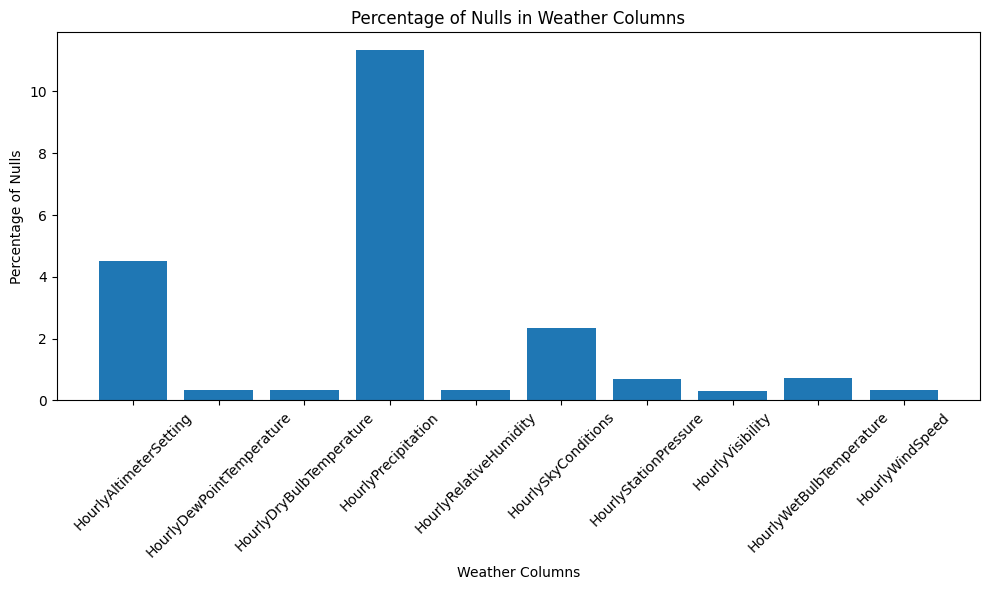

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col

weather_cols = ['HourlyDryBulbTemperature', 'HourlyWindSpeed', 'HourlyDewPointTemperature', 'HourlyRelativeHumidity', 'HourlyAltimeterSetting', 'HourlyVisibility', 'HourlyStationPressure', 'HourlyWetBulbTemperature', 'HourlySkyConditions', 'HourlyPrecipitation', 'oktas', 'elev_hundreds_ft', 'from_east', 'from_north']

cols_to_check = [c for c in df_gz.columns if c in weather_cols]
total_count = df_gz.count()
null_percentages = []

for col_name in cols_to_check:
    print(f"Column: {col_name}")
    null_count = df_gz.filter(col(col_name).isNull()).count()
    null_percentages.append((null_count / total_count) * 100)

plt.figure(figsize=(10, 6))
plt.bar(cols_to_check, null_percentages)
plt.ylabel('Percentage of Nulls')
plt.xlabel('Weather Columns')
plt.title('Percentage of Nulls in Weather Columns')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [0]:
path = "dbfs:/student-groups/Group_2_2/3_month_custom_joined/graph_feature_splits"
display(dbutils.fs.ls(path))

path,name,size,modificationTime
dbfs:/student-groups/Group_2_2/3_month_custom_joined/graph_feature_splits/test/,test/,0,1765249854608
dbfs:/student-groups/Group_2_2/3_month_custom_joined/graph_feature_splits/train/,train/,0,1765249854608
dbfs:/student-groups/Group_2_2/3_month_custom_joined/graph_feature_splits/validation/,validation/,0,1765249854608


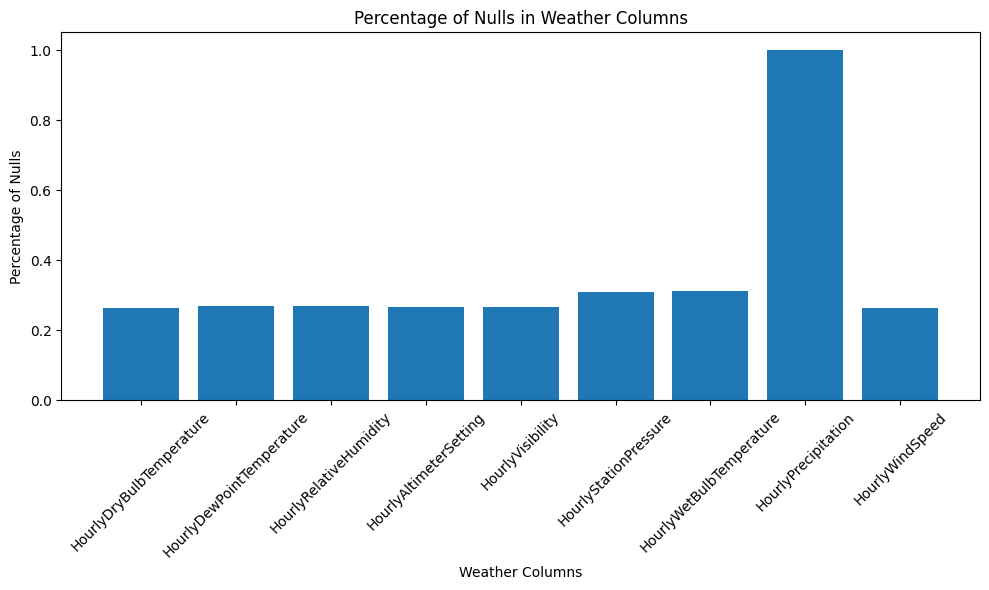

In [0]:
path = "dbfs:/student-groups/Group_2_2/3_month_custom_joined/graph_feature_splits/train"
df = spark.read.parquet(path)
weather_cols = ['HourlyDryBulbTemperature', 'HourlyWindSpeed', 'HourlyDewPointTemperature', 'HourlyRelativeHumidity', 'HourlyAltimeterSetting', 'HourlyVisibility', 'HourlyStationPressure', 'HourlyWetBulbTemperature', 'HourlySkyConditions', 'HourlyPrecipitation', 'oktas', 'elev_hundreds_ft', 'from_east', 'from_north']

import matplotlib.pyplot as plt
from pyspark.sql.functions import col, isnull

weather_cols = ['HourlyDryBulbTemperature', 'HourlyWindSpeed', 'HourlyDewPointTemperature', 'HourlyRelativeHumidity', 'HourlyAltimeterSetting', 'HourlyVisibility', 'HourlyStationPressure', 'HourlyWetBulbTemperature', 'HourlyPrecipitation', 'oktas', 'elev_hundreds_ft', 'from_east', 'from_north']

cols_to_check = [c for c in df.columns if c in weather_cols]

total_count = df.count()
null_percentages = []

for col_name in cols_to_check:
    null_count = df.filter(isnull(col(col_name))).count()
    null_percentages.append((null_count / total_count) * 100)

plt.figure(figsize=(10, 6))
plt.bar(cols_to_check, null_percentages)
plt.ylabel('Percentage of Nulls')
plt.xlabel('Weather Columns')
plt.title('Percentage of Nulls in Weather Columns')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [0]:
#my_nulls = null_percentages
my_nulls

[0.26362926463747555,
 0.2695227731483333,
 0.2695227731483333,
 0.2655236066588227,
 0.2666812601163126,
 0.3091987143732149,
 0.31330312208613365,
 1.0014754819521827,
 0.26362926463747555]

In [0]:
null_percentages

[4.510965395832486,
 0.32632515629426495,
 0.31804750089734063,
 11.348094676397192,
 0.3368863028351683,
 2.346429868635036,
 0.6867599615517178,
 0.29164463454508216,
 0.732001629841804,
 0.33153437046646733]

In [0]:
null_percentages = [4.510965395832486,
 0.32632515629426495,
 0.31804750089734063,
 11.348094676397192,
 0.3368863028351683,
 2.346429868635036,
 0.6867599615517178,
 0.29164463454508216,
 0.732001629841804,
 0.33153437046646733]

In [0]:
import pandas as pd
import numpy as np

# Ensure both lists are numpy arrays for elementwise operations
my_nulls_arr = np.array(my_nulls)
#null_percentages = null_percentages[:5] + null_percentages[6:]
null_percentages_arr = np.array(null_percentages)

# Elementwise absolute difference
abs_diff = np.abs(my_nulls_arr - null_percentages_arr)

# Elementwise percent difference (relative to null_percentages)
percent_diff = np.where(null_percentages_arr != 0, abs_diff / null_percentages_arr * 100, np.nan)

# Sumwise absolute difference
sum_abs_diff = np.abs(np.sum(my_nulls_arr) - np.sum(null_percentages_arr))

# Sumwise percent difference (relative to sum of null_percentages)
sum_percent_diff = (sum_abs_diff / np.sum(null_percentages_arr) * 100) if np.sum(null_percentages_arr) != 0 else np.nan

# Create table
result_df = pd.DataFrame({
    'Column': cols_to_check[:len(my_nulls_arr)],
    'my_nulls': my_nulls_arr,
    'null_percentages': null_percentages_arr,
    'abs_diff': abs_diff,
    'percent_diff': percent_diff
})

# Add sumwise row
sum_row = pd.DataFrame({
    'Column': ['SUM'],
    'my_nulls': [np.sum(my_nulls_arr)],
    'null_percentages': [np.sum(null_percentages_arr)],
    'abs_diff': [sum_abs_diff],
    'percent_diff': [sum_percent_diff]
})
result_df = pd.concat([result_df, sum_row], ignore_index=True)

display(result_df)

Column,my_nulls,null_percentages,abs_diff,percent_diff
HourlyAltimeterSetting,0.26362926463747555,4.510965395832486,4.24733613119501,94.15581274728837
HourlyDewPointTemperature,0.2695227731483333,0.32632515629426495,0.05680238314593167,17.406682276958723
HourlyDryBulbTemperature,0.2695227731483333,0.31804750089734063,0.048524727749007346,15.257069340931611
HourlyPrecipitation,0.2655236066588227,11.348094676397192,11.08257106973837,97.6601921800046
HourlyRelativeHumidity,0.2666812601163126,0.3368863028351683,0.07020504271885569,20.83938768896924
HourlySkyConditions,0.3091987143732149,0.6867599615517178,0.3775612471785029,54.9771780995229
HourlyStationPressure,0.31330312208613365,0.29164463454508216,0.021658487541051485,7.426328132123938
HourlyVisibility,1.0014754819521827,0.732001629841804,0.2694738521103788,36.8132858076581
HourlyWetBulbTemperature,0.26362926463747555,0.33153437046646733,0.06790510582899179,20.482071205302066
SUM,3.2224862607582843,18.882259628661526,15.659773367903242,82.93378904785925


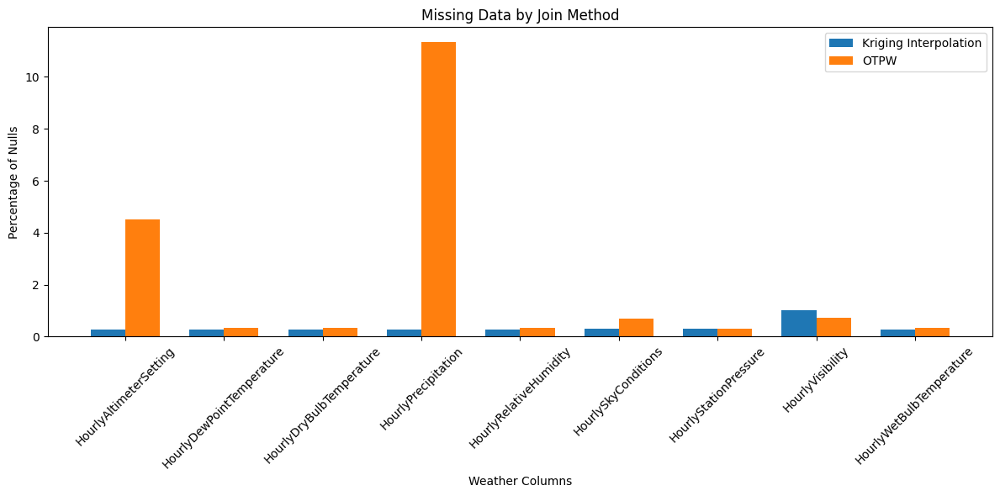

In [0]:
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(len(cols_to_check[:len(my_nulls_arr)]))
width = 0.35

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, my_nulls_arr, width, label='Kriging Interpolation')
plt.bar(x + width/2, null_percentages_arr, width, label='OTPW')
plt.ylabel('Percentage of Nulls')
plt.xlabel('Weather Columns')
plt.title('Missing Data by Join Method')
plt.xticks(x, cols_to_check[:len(my_nulls_arr)], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

CANCELLED,count
0.0,950198


CANCELLED,count
0.0,950198


In [0]:
path = flight_datasets['3m']
df = spark.read.parquet(path)
display(df.groupby('CANCELLED').count())

CANCELLED,count
0.0,2719940
1.0,87002


In [0]:
87002*100/(87002 + 2719940)

3.0995296660921388